You need to write a function that takes as input an image key and filters that need to be applied to it (**crop, blur, resize, pixelate, optimize, and others**) and returns a new image + saves it to the cache so that it can be processed faster next time.

статьи про кэширование в python (есть lru_cache декоратор из functools)
https://proglib.io/p/keshirovanie-v-python-algoritm-lru-2020-11-17

**blur**

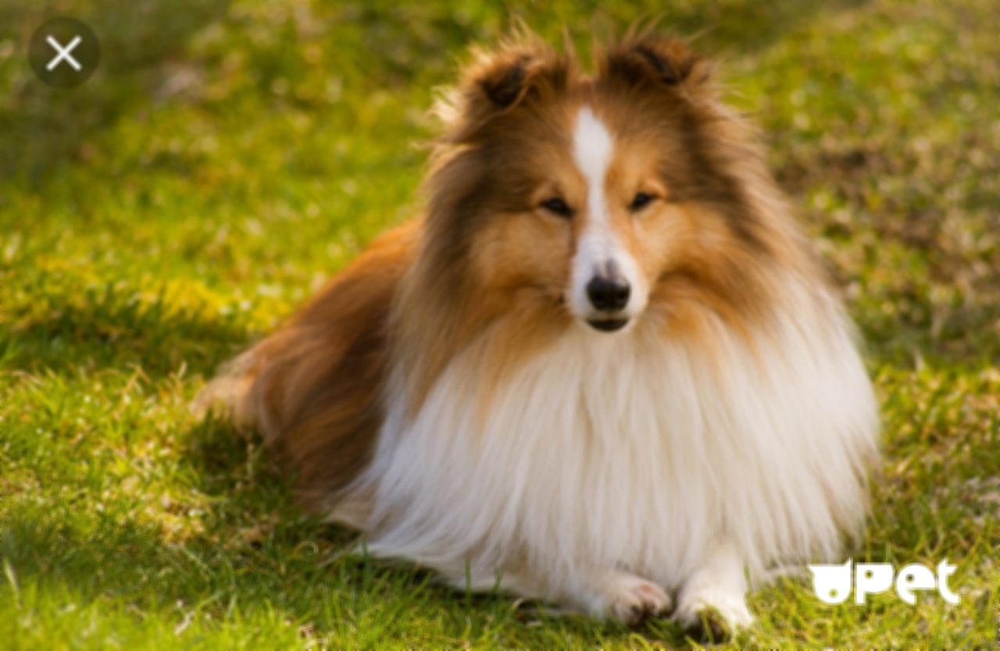

In [34]:
#Import required Image library
from PIL import Image, ImageFilter

def blur(image):
    image.show()
    blurImage = image.filter(ImageFilter.BLUR)
    blurImage.show()
    display(blurImage)

#Open existing image
OriImage = Image.open('s_4KGHyRlxaQ_a.jpg')
OriImage.show()
blur(OriImage)

**crop**

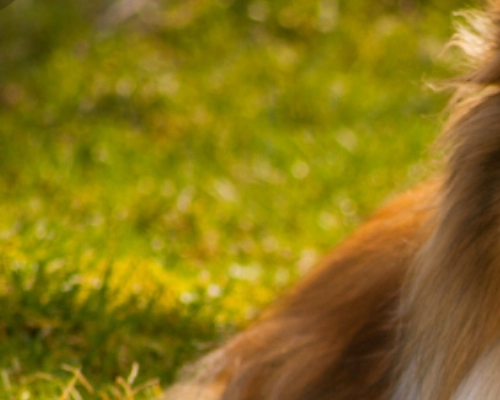

In [35]:
from PIL import Image

def crop(image, area):
    (width, height) = image.size
    sample_width = abs(area[0] - area[2])
    sample_height = abs(area[1] - area[3])

    if sample_width > width:
        print('Change the width <=', width)
    elif sample_height > height:
        print('Change the height <=', height)
    elif area[0] >= area[2]:
        print('Left border must be < right border')
    elif area[1] >= area[3]:
        print('Upper border must be < lower border')
    else:
        cropped_img = img.crop(area)
        display(cropped_img)
    

img = Image.open("s_4KGHyRlxaQ_a.jpg")
sample_area = (100, 100, 600, 500)
# left, up, right, bottom
crop(img, sample_area)

**pixelate**

In [5]:
# Зачем переводить в ргб?
# Если не переводить, результат будет ведь тот же


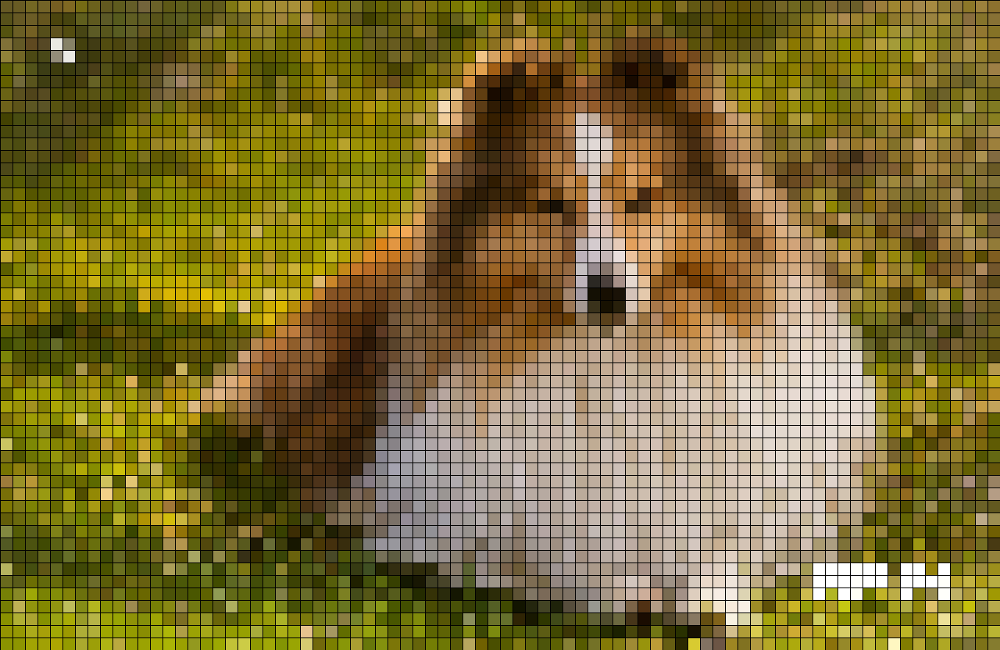

In [29]:
from PIL import Image

def pixelate(image, pixel_size=16, draw_margin=True):
    margin_color = (0, 0, 0)

    image = image.resize((image.size[0] // pixel_size, image.size[1] // pixel_size), Image.NEAREST)
    image = image.resize((image.size[0] * pixel_size, image.size[1] * pixel_size), Image.NEAREST)
    pixel = image.load()

    # Draw black margin between pixels
    if draw_margin:
        for i in range(0, image.size[0], pixel_size):
            for j in range(0, image.size[1], pixel_size):
                for r in range(pixel_size):
                    pixel[i+r, j] = margin_color
                    pixel[i, j+r] = margin_color

    return image
image = Image.open("s_4KGHyRlxaQ_a.jpg").convert('RGB') 

image_pixelate = pixelate(image)
display(image_pixelate)

#image_pixelate.save('output.jpg')

# for size in (16, 32, 48):
#    image_pixelate = pixelate(image, pixel_size=size)
#   display(image_pixelate)
#    image_pixelate.save('output_{}.jpg'.format(size))

**optimize**

In [8]:
# не оч понятно, что именно делает функция (сохраняет размазанного по ширине вьетамца...)

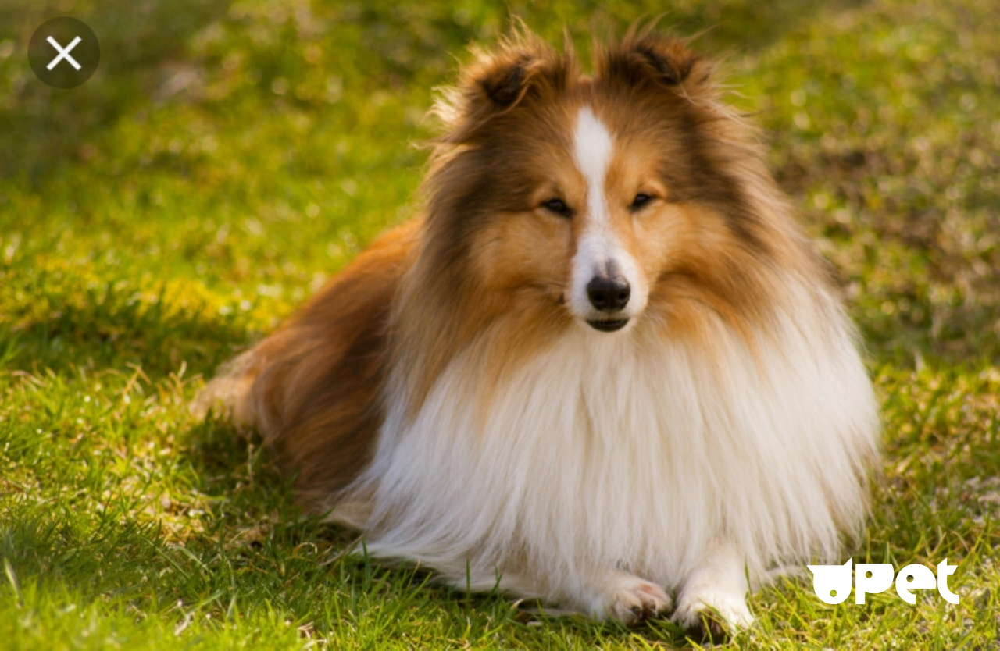

In [47]:
from PIL import Image
from datetime import datetime

# timestamp = datetime.now().timestamp()

# path = 'public/build/screenshots'
# img = f'{path}/screenshot.png'
# im = Image.open(img)
def optimize(image):
    image = image.convert("RGB")
    image = image.resize((1200, 750), Image.ANTIALIAS)
    im.save("81.jpg", optimize=True, quality=75)
    display(im)

im = Image.open("s_4KGHyRlxaQ_a.jpg")
optimize(im)

**resize**

In [10]:
# можно по идее добавить ввод размера от пользователя

In [44]:
from PIL import Image
 
# Меняем размер изображения на новый.
def resize(image, size):
    image = image.resize(size, Image.ANTIALIAS)
    display(image)


tatras = Image.open('s_4KGHyRlxaQ_a.jpg')
sample_size = (200, 10)
resize(tatras, sample_size)

**допы** - вроде у Маши были более удобные, эти просто для примера

оттенки серого, сепия, негатив, добавление шумов, яркость, чб

In [12]:

from PIL import Image, ImageDraw #Подключим необходимые библиотеки. 

mode = int(input('mode:')) #Считываем номер преобразования. 
image = Image.open("s_4KGHyRlxaQ_a.jpg") #Открываем изображение. 
draw = ImageDraw.Draw(image) #Создаем инструмент для рисования. 
width = image.size[0] #Определяем ширину. 
height = image.size[1] #Определяем высоту. 	
pix = image.load() #Выгружаем значения пикселей.

mode:2


**grey**

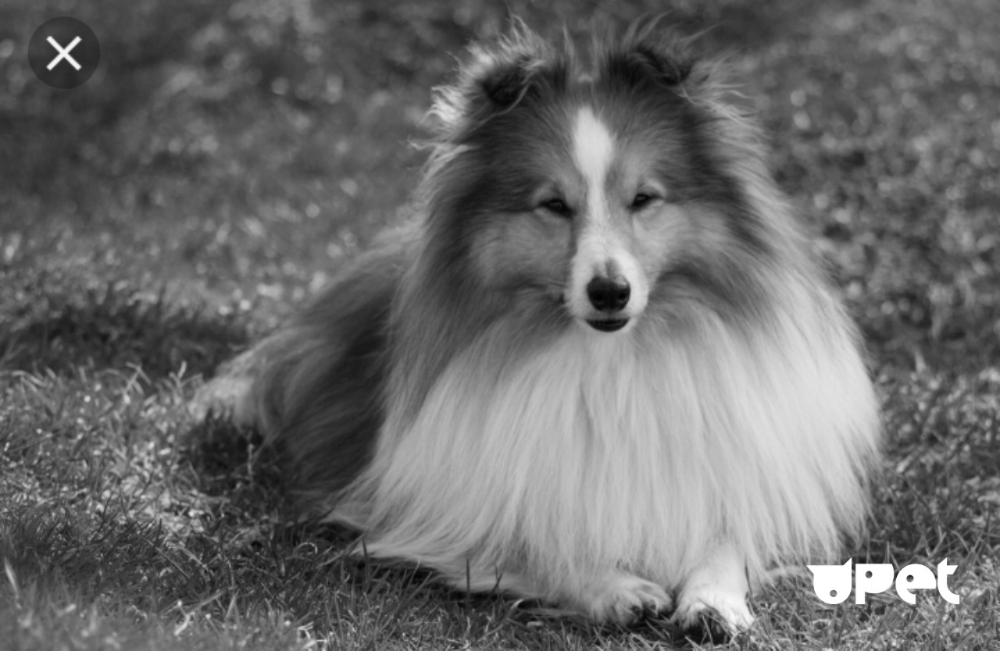

In [49]:

from PIL import Image, ImageDraw

def grey(image):
    width = image.size[0]
    height = image.size[1]
    draw = ImageDraw.Draw(image)
    pix = image.load()
    for i in range(width):
        for j in range(height):
            a = pix[i, j][0]
            b = pix[i, j][1]
            c = pix[i, j][2]
            S = (a + b + c) // 3
            draw.point((i, j), (S, S, S))
    display(image)
            
img = Image.open("s_4KGHyRlxaQ_a.jpg").convert('RGB')
grey(img)

**sepia**

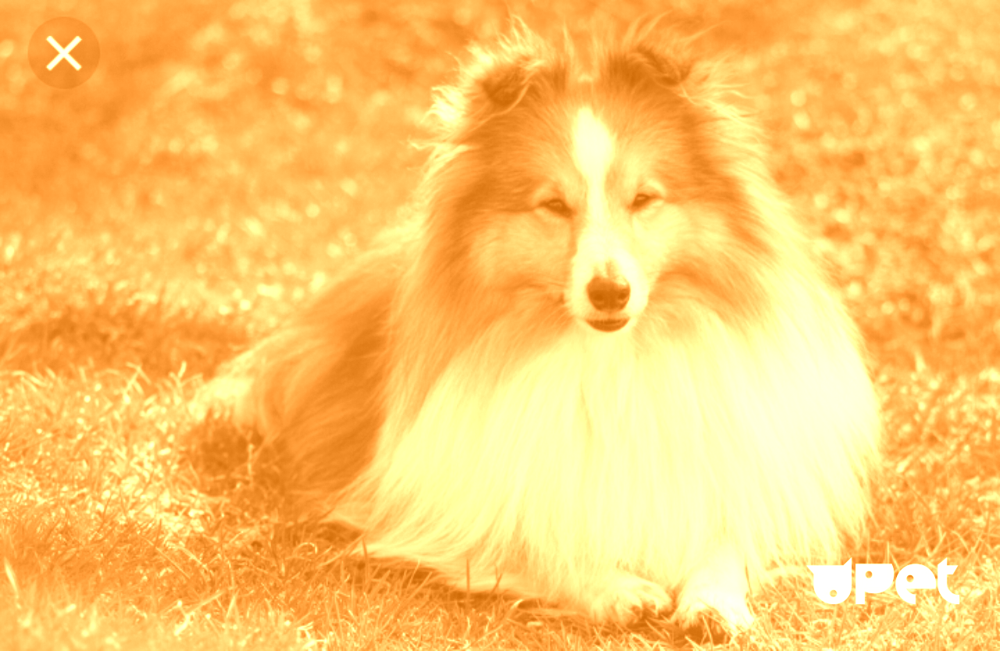

In [56]:

from PIL import Image, ImageDraw

def sepia(image, depth):
    width = image.size[0]
    height = image.size[1]
    draw = ImageDraw.Draw(image)
    pix = image.load()
    for i in range(width):
        for j in range(height):
            a = pix[i, j][0]
            b = pix[i, j][1]
            c = pix[i, j][2]
            S = (a + b + c) // 3
            a = S + depth * 2
            b = S + depth
            c = S
            if (a > 255):
                a = 255
            if (b > 255):
                b = 255
            if (c > 255):
                c = 255
            draw.point((i, j), (a, b, c))
    display(image)


img = Image.open("s_4KGHyRlxaQ_a.jpg").convert('RGB')
sample_depth = 100
sepia(img, sample_depth)

# depth = int(input('depth:'))

**negative**

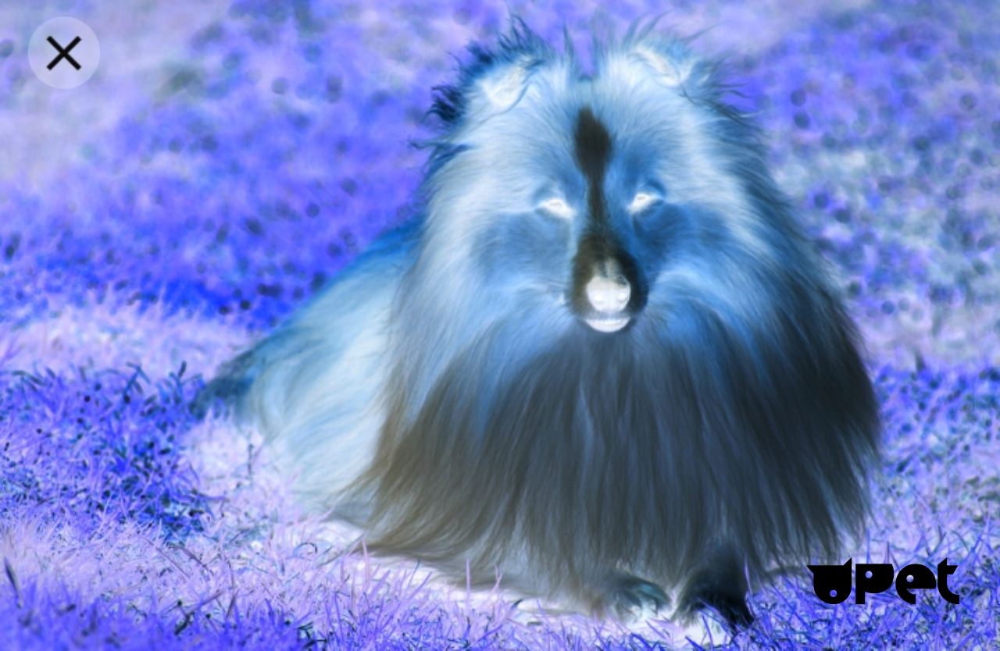

In [58]:

from PIL import Image, ImageDraw

def negative(image):
    width = image.size[0]
    height = image.size[1]
    draw = ImageDraw.Draw(image)
    pix = image.load()
    for i in range(width):
        for j in range(height):
            a = pix[i, j][0]
            b = pix[i, j][1]
            c = pix[i, j][2]
            draw.point((i, j), (255 - a, 255 - b, 255 - c))
    display(image)
    
    
img = Image.open("s_4KGHyRlxaQ_a.jpg").convert('RGB')
negative(img)

**noise**

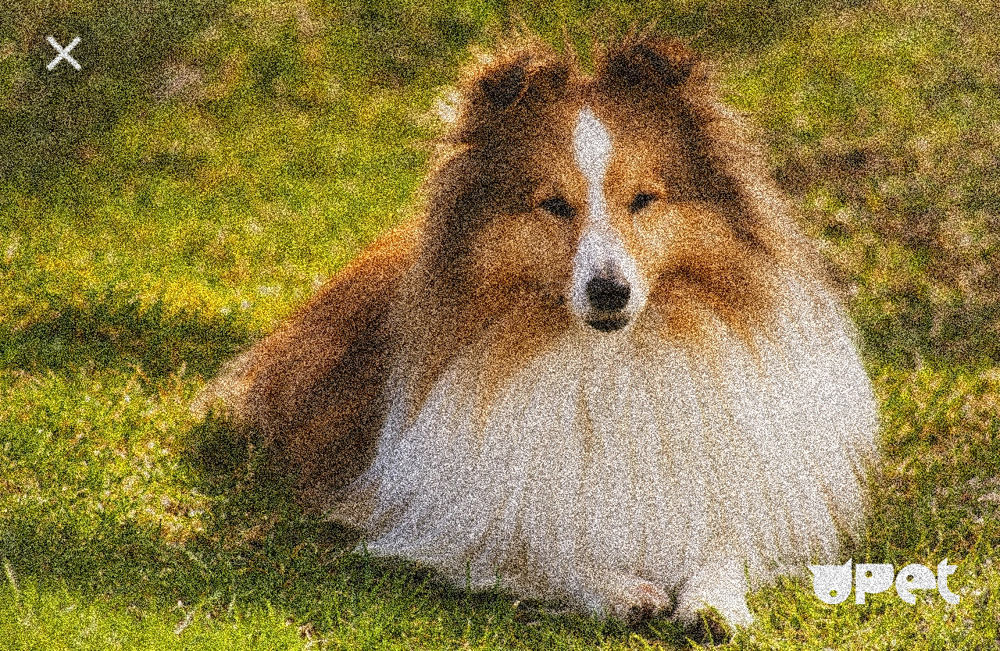

In [62]:
import random
from PIL import Image, ImageDraw

def noise(image, factor):
    width = image.size[0]
    height = image.size[1]
    draw = ImageDraw.Draw(image)
    pix = image.load()
    
    for i in range(width):
        for j in range(height):
            rand = random.randint(-factor, factor)
            a = pix[i, j][0] + rand
            b = pix[i, j][1] + rand
            c = pix[i, j][2] + rand
            if (a < 0):
                a = 0
            if (b < 0):
                b = 0
            if (c < 0):
                c = 0
            if (a > 255):
                a = 255
            if (b > 255):
                b = 255
            if (c > 255):
                c = 255
            draw.point((i, j), (a, b, c))
    display(image)


img = Image.open("s_4KGHyRlxaQ_a.jpg").convert('RGB')
sample_factor = 100
noise(img, sample_factor)


# factor = int(input('factor:'))

**brightness**

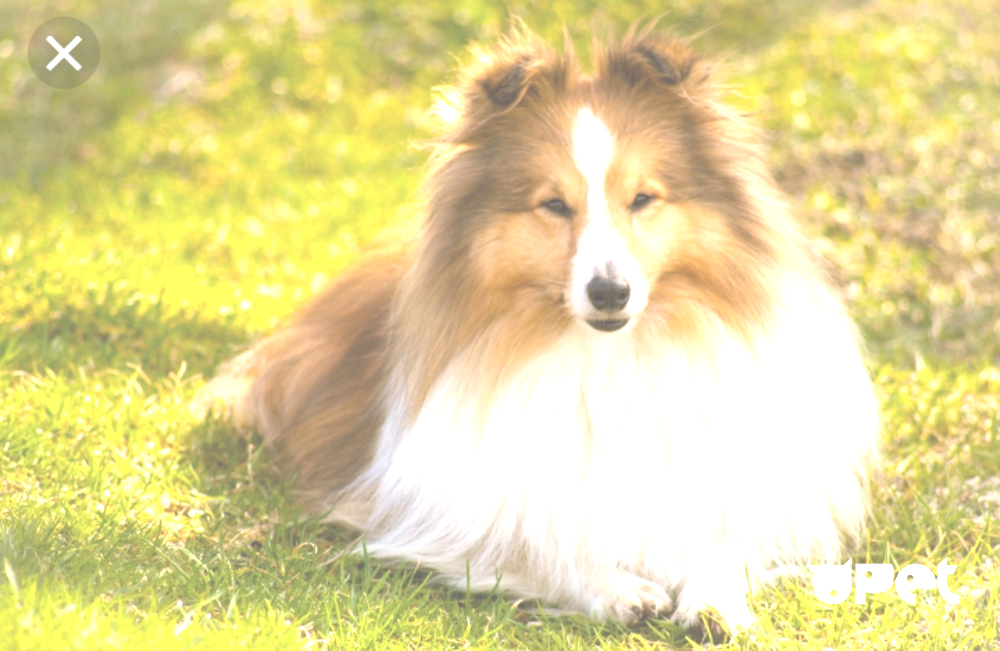

In [64]:
import random
from PIL import Image, ImageDraw

def bright(image, factor):
    width = image.size[0]
    height = image.size[1]
    draw = ImageDraw.Draw(image)
    pix = image.load()
    for i in range(width):
        for j in range(height):
            a = pix[i, j][0] + factor
            b = pix[i, j][1] + factor
            c = pix[i, j][2] + factor
            if (a < 0):
                a = 0
            if (b < 0):
                b = 0
            if (c < 0):
                c = 0
            if (a > 255):
                a = 255
            if (b > 255):
                b = 255
            if (c > 255):
                c = 255
            draw.point((i, j), (a, b, c))

    display(image)


img = Image.open("s_4KGHyRlxaQ_a.jpg").convert('RGB')
sample_factor = 100

bright(img, sample_factor)


# factor = int(input('factor:'))

**black & white**

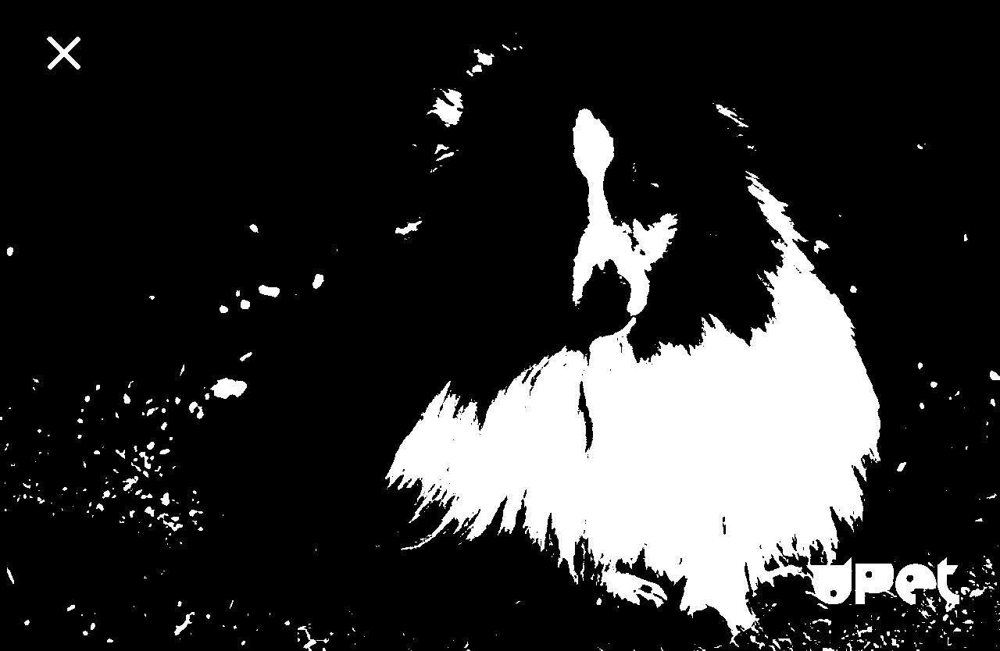

In [4]:
import random
from PIL import Image, ImageDraw

def bw(image, factor):
    width = image.size[0]
    height = image.size[1]
    draw = ImageDraw.Draw(image)
    pix = image.load()
  
    for i in range(width):
        for j in range(height):
            a = pix[i, j][0]
            b = pix[i, j][1]
            c = pix[i, j][2]
            S = a + b + c
            if (S > (((255 + factor) // 2) * 3)):
                a, b, c = 255, 255, 255
            else:
                a, b, c = 0, 0, 0
            draw.point((i, j), (a, b, c))

    display(image)


img = Image.open("s_4KGHyRlxaQ_a.jpg").convert('RGB')
sample_factor = 60

bw(img,sample_factor)

# factor = int(input('factor:'))

**Всё в одном:**

In [52]:
import random
from PIL import Image, ImageDraw  

mode = int(input('mode:'))  
image = Image.open("s_4KGHyRlxaQ_a.jpg")  
draw = ImageDraw.Draw(image)  
width = image.size[0]  
height = image.size[1] 
pix = image.load() 
if (mode == 0): #оттенки серого
	for i in range(width):
		for j in range(height):
			a = pix[i, j][0]
			b = pix[i, j][1]
			c = pix[i, j][2]
			S = (a + b + c) // 3
			draw.point((i, j), (S, S, S))
if (mode == 1): #сепия
	depth = int(input('depth:'))
	for i in range(width):
		for j in range(height):
			a = pix[i, j][0]
			b = pix[i, j][1]
			c = pix[i, j][2]
			S = (a + b + c) // 3
			a = S + depth * 2
			b = S + depth
			c = S
			if (a > 255):
				a = 255
			if (b > 255):
				b = 255
			if (c > 255):
				c = 255
			draw.point((i, j), (a, b, c))
if (mode == 2): #негатив
	for i in range(width):
		for j in range(height):
			a = pix[i, j][0]
			b = pix[i, j][1]
			c = pix[i, j][2]
			draw.point((i, j), (255 - a, 255 - b, 255 - c))
if (mode == 3): #шумы
	factor = int(input('factor:'))
	for i in range(width):
		for j in range(height):
			rand = random.randint(-factor, factor)
			a = pix[i, j][0] + rand
			b = pix[i, j][1] + rand
			c = pix[i, j][2] + rand
			if (a < 0):
				a = 0
			if (b < 0):
				b = 0
			if (c < 0):
				c = 0
			if (a > 255):
				a = 255
			if (b > 255):
				b = 255
			if (c > 255):
				c = 255
			draw.point((i, j), (a, b, c))
if (mode == 4): #яркость
	factor = int(input('factor:'))
	for i in range(width):
		for j in range(height):
			a = pix[i, j][0] + factor
			b = pix[i, j][1] + factor
			c = pix[i, j][2] + factor
			if (a < 0):
				a = 0
			if (b < 0):
				b = 0
			if (c < 0):
				c = 0
			if (a > 255):
				a = 255
			if (b > 255):
				b = 255
			if (c > 255):
				c = 255
			draw.point((i, j), (a, b, c))
if (mode == 5): #чб
	factor = int(input('factor:'))
	for i in range(width):
		for j in range(height):
			a = pix[i, j][0]
			b = pix[i, j][1]
			c = pix[i, j][2]
			S = a + b + c
			if (S > (((255 + factor) // 2) * 3)):
				a, b, c = 255, 255, 255
			else:
				a, b, c = 0, 0, 0
			draw.point((i, j), (a, b, c))
image.save("ans.jpg", "JPEG")
del draw

mode:1
depth:100
